# Analysis of my Chrome History from 2020

This notebook will deal with analysis of history for my chrome browser starting from Jan 1 2020. I just want to do exploratory data analysis and some descriptive analysis on this viz Visualization.

In [1]:
#Importing Libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from PIL import Image
%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
#Read dataset
mydateparser = lambda x: pd.datetime.strptime(x, "%m/%d/%Y %H:%M")

data = pd.read_csv('chrome_history.csv',encoding= 'unicode_escape',parse_dates=['Visited On'],date_parser=mydateparser)
data.head()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  


,URL,Title,Visited On,Visit Count,Typed Count,Unnamed: 5,Unnamed: 6,URL Length,Transition Type
0,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-19 08:51:00,1,0,NaN,NaN,79,Auto TopLevel
1,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-27 17:18:00,1,0,NaN,NaN,78,Auto TopLevel
2,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-19 16:18:00,1,0,NaN,NaN,78,Auto TopLevel
3,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-27 17:40:00,1,0,NaN,NaN,78,Auto TopLevel
4,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-17 18:35:00,1,0,NaN,NaN,78,Auto TopLevel


In [3]:
data.shape

(14314, 9)

In [4]:
data.drop(['Unnamed: 5','Unnamed: 6'],axis=1,inplace=True)

In [5]:
data['Transition Type'].unique()

array(['Auto TopLevel', 'Reload', 'Link', 'Typed', 'Form Submit',
       'Auto Bookmark', 'Manual Subframe', 'Generated'], dtype=object)

In [6]:
data['Typed Count'].unique()

array([  0,   1,   8,   2,   3,  20,  33,  31,  15,  25,   5,   7,  22,
       161,  24,  83,  99,   4,  14, 124], dtype=int64)

In [7]:
data[data['Visited On']>'2020-04-20 08:51:00']

,URL,Title,Visited On,Visit Count,Typed Count,URL Length,Transition Type
1,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-27 17:18:00,1,0,78,Auto TopLevel
3,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-27 17:40:00,1,0,78,Auto TopLevel
5,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-25 19:51:00,1,0,78,Auto TopLevel
6,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-27 09:55:00,1,0,78,Auto TopLevel
8,file:///C:/Users/Suyog/Desktop/1.html,History,2020-04-28 13:33:00,1,0,37,Auto TopLevel
9,file:///C:/Users/Suyog/Desktop/1.html,History,2020-04-28 13:34:00,1,0,37,Reload
13,file:///C:/Users/Suyog/Documents/Github%20Back...,AI Demo,2020-04-24 09:44:00,1,0,99,Auto TopLevel
14,file:///C:/Users/Suyog/Documents/Github%20Back...,NaN,2020-04-24 09:44:00,1,0,100,Auto TopLevel
15,file:///C:/Users/Suyog/Documents/Github%20Back...,ML API,2020-04-24 08:44:00,4,0,86,Auto TopLevel
16,file:///C:/Users/Suyog/Documents/Github%20Back...,ML API,2020-04-24 08:51:00,4,0,86,Auto TopLevel


In [8]:
data.columns

Index(['URL', 'Title', 'Visited On', 'Visit Count', 'Typed Count',
       'URL Length', 'Transition Type'],
      dtype='object')

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14314 entries, 0 to 14313
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   URL              14314 non-null  object        
 1   Title            14265 non-null  object        
 2   Visited On       14314 non-null  datetime64[ns]
 3   Visit Count      14314 non-null  int64         
 4   Typed Count      14314 non-null  int64         
 5   URL Length       14314 non-null  int64         
 6   Transition Type  14314 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 782.9+ KB


In [10]:
data['URL'].dtype

dtype('O')

In [11]:
numerical_col =[feature for feature in data.columns if data[feature].dtype!='O' and data[feature].dtype!='datetime64[ns]']
for n in numerical_col:
    print("Numerical_col : ",n,"\nTheir dtype is : ",data[n].dtype,"\n----")

Numerical_col :  Visit Count 
Their dtype is :  int64 
----
Numerical_col :  Typed Count 
Their dtype is :  int64 
----
Numerical_col :  URL Length 
Their dtype is :  int64 
----


In [12]:
numerical_col

['Visit Count', 'Typed Count', 'URL Length']

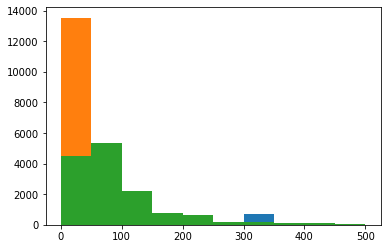

In [13]:
for col in numerical_col:    
    plt.hist(data[col],bins=10,range=(0,500))

(array([11678.,   987.,   355.,   176.,   442.,     0.,   676.,     0.,
            0.,     0.]),
 array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450., 500.]),
 <a list of 10 Patch objects>)

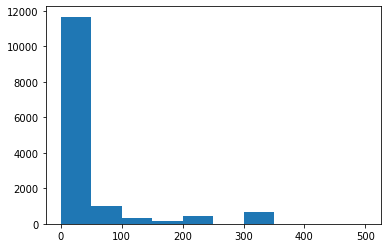

In [14]:
plt.hist(data['Visit Count'],bins=10,range=(0,500))

(array([13545.,   300.,   133.,   336.,     0.,     0.,     0.,     0.,
            0.,     0.]),
 array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450., 500.]),
 <a list of 10 Patch objects>)

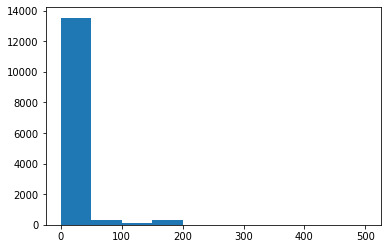

In [15]:
plt.hist(data['Typed Count'],bins=10,range=(0,500))

(array([4485., 5336., 2232.,  744.,  639.,  154.,  154.,  134.,  124.,
          51.]),
 array([  0.,  50., 100., 150., 200., 250., 300., 350., 400., 450., 500.]),
 <a list of 10 Patch objects>)

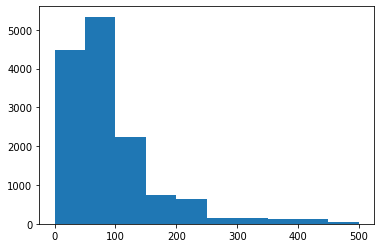

In [16]:
plt.hist(data['URL Length'],bins=10,range=(0,500))

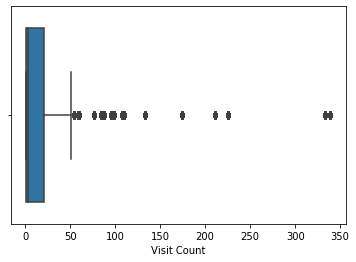

In [17]:
sns.boxplot(data['Visit Count'])

In [18]:
from wordcloud import WordCloud, STOPWORDS,ImageColorGenerator
stopwords = set(STOPWORDS)
stopwords.add("free")
word = ''

In [19]:
for var in data['Title'].values:
    val = str(var)
    token = val.split()
    for i in range(len(token)):
        token[i] = token[i].lower()
    word += " ".join(token)+" "

In [20]:
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(word)

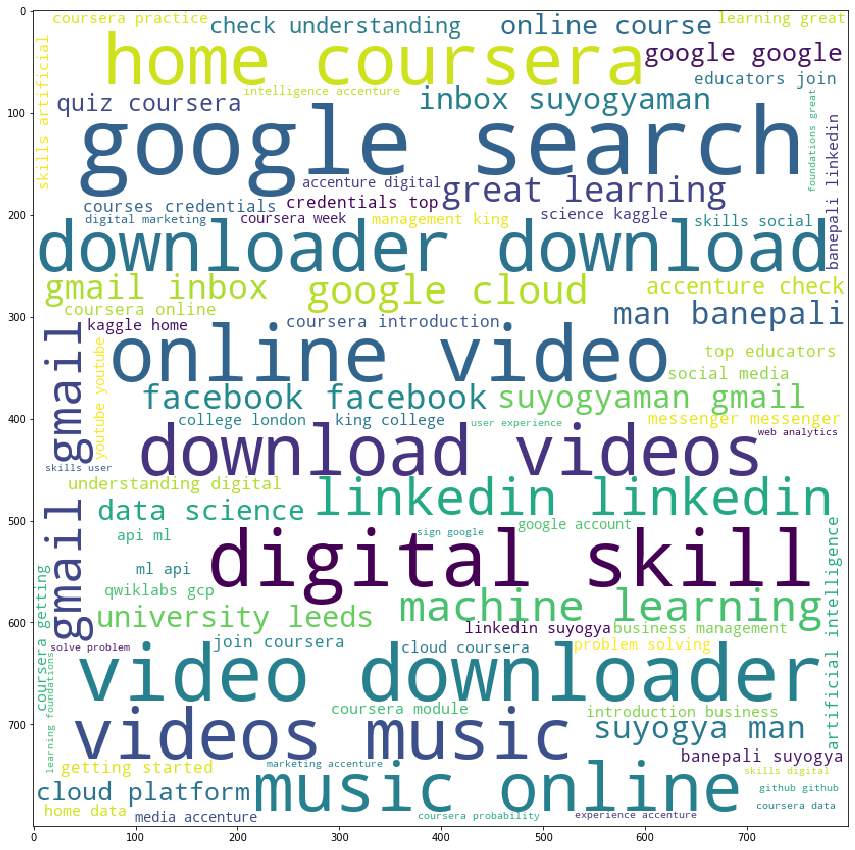

In [21]:
plt.figure(figsize = (15, 15))
plt.imshow(wordcloud)
plt.show() 

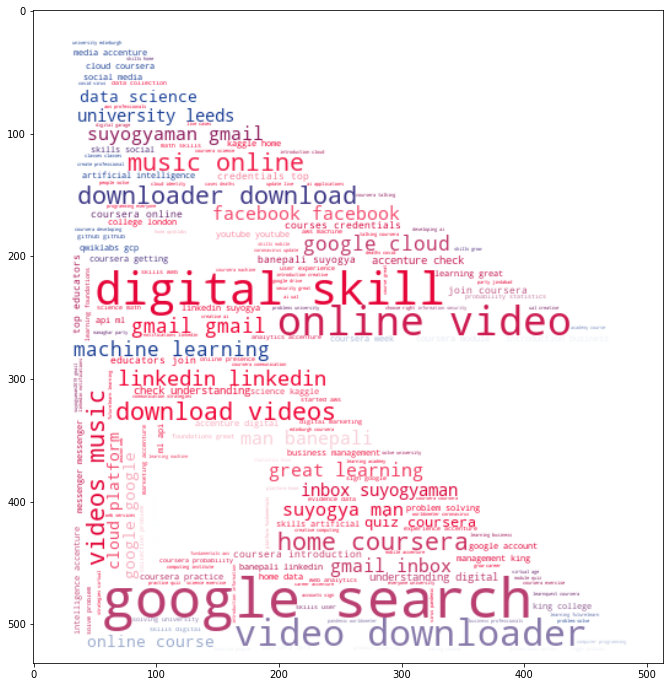

In [22]:
maskNepal = np.array(Image.open("nepal.jpg"))
wc = WordCloud(background_color="white", max_words=2000, mask=maskNepal,stopwords=stopwords).generate(word)
image_colors = ImageColorGenerator(maskNepal)
plt.figure(figsize = (12, 12))
plt.imshow(wc, interpolation="bilinear")
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.show()

In [23]:
data.head()

,URL,Title,Visited On,Visit Count,Typed Count,URL Length,Transition Type
0,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-19 08:51:00,1,0,79,Auto TopLevel
1,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-27 17:18:00,1,0,78,Auto TopLevel
2,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-19 16:18:00,1,0,78,Auto TopLevel
3,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-27 17:40:00,1,0,78,Auto TopLevel
4,file:///C:/Users/Suyog/AppData/Roaming/jupyter...,Opening Jupyter Notebook,2020-04-17 18:35:00,1,0,78,Auto TopLevel


In [24]:
data.isnull().sum()

URL                 0
Title              49
Visited On          0
Visit Count         0
Typed Count         0
URL Length          0
Transition Type     0
dtype: int64

In [25]:
features_with_na = [features for features in data.columns if data[features].isnull().sum() > 1]

In [26]:
print(data[data["Title"].isnull()])

                                                     URL Title  \
14     file:///C:/Users/Suyog/Documents/Github%20Back...   NaN   
142                                  http://192.168.1.1/   NaN   
143                                  http://192.168.1.1/   NaN   
147    http://209.250.252.94/cbtracking/entry.php?hop...   NaN   
166                                http://glassdoor.com/   NaN   
366        https://accounts.google.com/_/back?backstep=1   NaN   
442    https://accounts.google.com/o/oauth2/auth?oper...   NaN   
532    https://accounts.google.com/signin/oauth/conse...   NaN   
543    https://accounts.google.com/signin/oauth/conse...   NaN   
544    https://accounts.google.com/signin/oauth/conse...   NaN   
601    https://accounts.google.com/signin/oauth?opera...   NaN   
662    https://adria-music.com/how-to-sing-twinkle-tw...   NaN   
667    https://alison.com/courseware/1680/14021/1/1.html   NaN   
668    https://alison.com/courseware/1680/14021/1/1.html   NaN   
669    htt

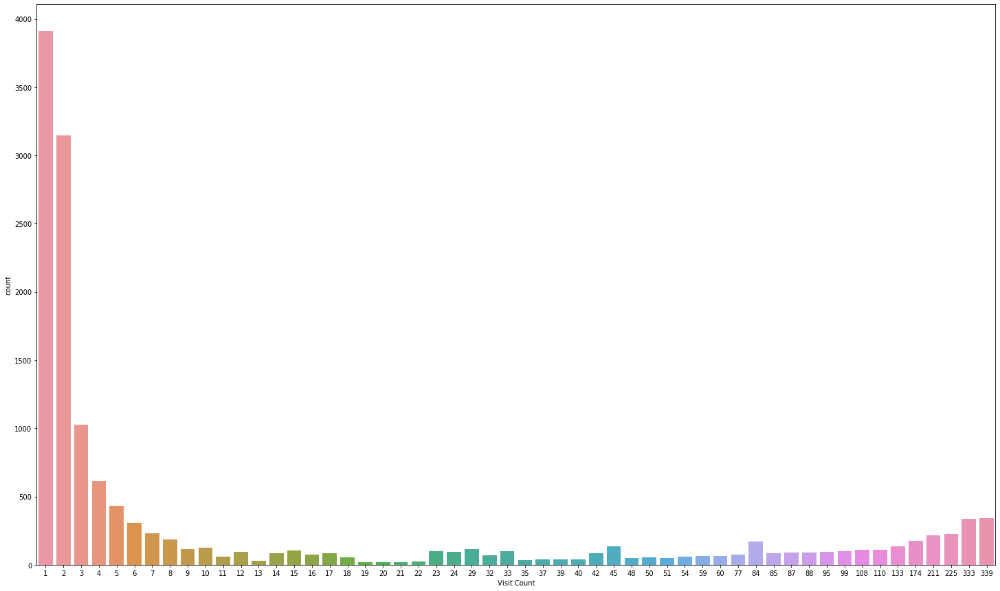

In [27]:
fig, ax = plt.subplots(figsize=(25,15))
sns.countplot(ax=ax,x=data['Visit Count'])

In [28]:
data['Title']

0                                 Opening Jupyter Notebook
1                                 Opening Jupyter Notebook
2                                 Opening Jupyter Notebook
3                                 Opening Jupyter Notebook
4                                 Opening Jupyter Notebook
5                                 Opening Jupyter Notebook
6                                 Opening Jupyter Notebook
7                                 Opening Jupyter Notebook
8                                                  History
9                                                  History
10       Test: Introduction to Information Security - G...
11       Test: Introduction to Information Security - G...
12       Test: Introduction to Information Security - G...
13                                                 AI Demo
14                                                     NaN
15                                                  ML API
16                                                  ML A

In [29]:
data.loc[data['Title']=='Messenger']

,URL,Title,Visited On,Visit Count,Typed Count,URL Length,Transition Type
8004,https://www.facebook.com/messages,Messenger,2020-04-15 19:23:00,16,0,33,Link
8005,https://www.facebook.com/messages,Messenger,2020-04-17 08:52:00,16,0,33,Link
8006,https://www.facebook.com/messages,Messenger,2020-04-17 08:54:00,16,0,33,Link
8007,https://www.facebook.com/messages,Messenger,2020-04-17 18:45:00,16,0,33,Link
8008,https://www.facebook.com/messages,Messenger,2020-04-17 20:46:00,16,0,33,Link
8009,https://www.facebook.com/messages,Messenger,2020-04-20 09:39:00,16,0,33,Link
8010,https://www.facebook.com/messages,Messenger,2020-04-20 18:44:00,16,0,33,Link
8011,https://www.facebook.com/messages,Messenger,2020-04-20 18:52:00,16,0,33,Link
8012,https://www.facebook.com/messages,Messenger,2020-04-21 13:38:00,16,0,33,Link
8013,https://www.facebook.com/messages,Messenger,2020-04-21 17:09:00,16,0,33,Link


In [30]:
data.loc[data['Title']=='Suyogya Man Banepali']

,URL,Title,Visited On,Visit Count,Typed Count,URL Length,Transition Type
7993,https://www.facebook.com/media/set/?set=a.2363...,Suyogya Man Banepali,2020-04-23 08:43:00,2,0,62,Link
7994,https://www.facebook.com/media/set/?set=a.2363...,Suyogya Man Banepali,2020-04-28 09:48:00,2,0,62,Link
8214,https://www.facebook.com/photo.php?fbid=102098...,Suyogya Man Banepali,2020-04-23 08:44:00,1,0,92,Link
8219,https://www.facebook.com/photo.php?fbid=102098...,Suyogya Man Banepali,2020-04-23 08:38:00,2,0,92,Link
8220,https://www.facebook.com/photo.php?fbid=102098...,Suyogya Man Banepali,2020-04-23 08:38:00,2,0,92,Link
8221,https://www.facebook.com/photo.php?fbid=102098...,Suyogya Man Banepali,2020-04-23 08:38:00,1,0,100,Link
8222,https://www.facebook.com/photo.php?fbid=102105...,Suyogya Man Banepali,2020-04-28 09:49:00,1,0,92,Link
8235,https://www.facebook.com/photo.php?fbid=102165...,Suyogya Man Banepali,2020-04-17 19:57:00,1,0,92,Link
8238,https://www.facebook.com/photo.php?fbid=102166...,Suyogya Man Banepali,2020-04-26 11:47:00,1,0,92,Link
8283,https://www.facebook.com/profile.php?preview_c...,Suyogya Man Banepali,2020-04-23 08:44:00,1,0,68,Link


In [31]:
data_339 = data.loc[data['Visit Count']==339]
data_339

,URL,Title,Visited On,Visit Count,Typed Count,URL Length,Transition Type
10471,https://www.google.com.np/,Google,2020-02-26 22:15:00,339,2,26,Typed
10472,https://www.google.com.np/,Google,2020-02-29 13:12:00,339,2,26,Typed
10473,https://www.google.com.np/,Google,2020-04-07 09:27:00,339,2,26,Link
10474,https://www.google.com.np/,Google,2020-04-07 09:33:00,339,2,26,Auto TopLevel
10475,https://www.google.com.np/,Google,2020-04-07 09:33:00,339,2,26,Link
10476,https://www.google.com.np/,Google,2020-04-07 09:41:00,339,2,26,Auto TopLevel
10477,https://www.google.com.np/,Google,2020-04-07 09:41:00,339,2,26,Link
10478,https://www.google.com.np/,Google,2020-04-07 09:56:00,339,2,26,Auto TopLevel
10479,https://www.google.com.np/,Google,2020-04-07 09:56:00,339,2,26,Link
10480,https://www.google.com.np/,Google,2020-04-07 10:39:00,339,2,26,Auto TopLevel


In [32]:
data_339['URL'].unique()

array(['https://www.google.com.np/'], dtype=object)

In [33]:
data_339['Transition Type'].unique()

array(['Typed', 'Link', 'Auto TopLevel', 'Reload'], dtype=object)

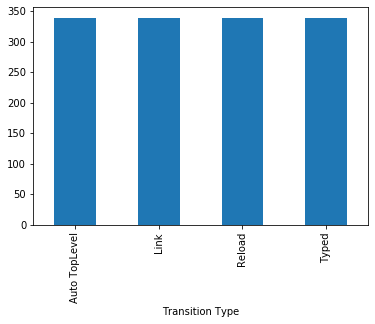

In [34]:
data_339.groupby('Transition Type')['Visit Count'].median().plot.bar()

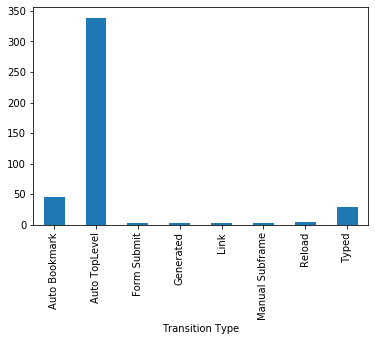

In [35]:
data.groupby('Transition Type')['Visit Count'].median().plot.bar()

In [36]:
data_title = data['Title'].value_counts()
data_title

Online video downloader - Download videos and music for free                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [37]:
data_title = pd.DataFrame(data_title)
data_title=data_title.reset_index()
data_title.columns=['Title','Count']
data_title_backup = data_title.copy()
data_title

,Title,Count
0,Online video downloader - Download videos and ...,793
1,LinkedIn,597
2,Facebook,474
3,Inbox - suyogyaman@gmail.com - Gmail,452
4,Google,340
5,Suyogya Man Banepali,210
6,Messenger,185
7,ML API,182
8,Suyogya Man Banepali | LinkedIn,172
9,Coursera | Online Courses & Credentials From T...,156


In [38]:
data_title.shape

(3129, 2)

In [39]:
data_title.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Title   3129 non-null   object
 1   Count   3129 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 49.0+ KB


In [40]:
data_title = data_title.apply(lambda x: x.astype(str).str.lower())
data_title

,Title,Count
0,online video downloader - download videos and ...,793
1,linkedin,597
2,facebook,474
3,inbox - suyogyaman@gmail.com - gmail,452
4,google,340
5,suyogya man banepali,210
6,messenger,185
7,ml api,182
8,suyogya man banepali | linkedin,172
9,coursera | online courses & credentials from t...,156


In [41]:
data_title.shape

(3129, 2)

In [42]:
data_title.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Title   3129 non-null   object
 1   Count   3129 non-null   object
dtypes: object(2)
memory usage: 49.0+ KB


In [43]:
list1 = data_title[0:49]

In [44]:
list1 = list1['Title']

In [45]:
final_list = list1.to_list()

In [46]:
len(final_list)

49

In [47]:
#list = ['google','facebook','youtube','linkedin','quora','coursera','accenture','learning','ml',
#        'skillzcafe','amazon','aws','stock','wiki','gmail','university','stack','certificate','jup',
#        'kaggle','download','github','corona','messenger','suyogya','nepse']
search_list = '|'.join(final_list)
df_search_list = data_title.loc[data_title['Title'].str.contains(search_list)]
df_rest = data_title.loc[~data_title['Title'].str.contains(search_list)]

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\strings.py:1952: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


In [48]:
df_search_list

,Title,Count
0,online video downloader - download videos and ...,793
1,linkedin,597
2,facebook,474
3,inbox - suyogyaman@gmail.com - gmail,452
4,google,340
5,suyogya man banepali,210
6,messenger,185
7,ml api,182
8,suyogya man banepali | linkedin,172
9,coursera | online courses & credentials from t...,156


In [49]:
df_rest

,Title,Count
16,"coronavirus update (live): 3,064,823 cases and...",77
49,nepal stock exchange ltd.,38
50,to do - digital skills: social media - accenture,36
51,inbox - suyogyaman2019@gmail.com - gmail,35
52,check your understanding - digital skills: mob...,34
53,course stream,33
54,amazon web services sign-in,32
56,to do - digital skills: artificial intelligenc...,29
57,gmail,29
58,mero share,29


In [50]:
df_rest.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1288 entries, 16 to 3126
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Title   1288 non-null   object
 1   Count   1288 non-null   object
dtypes: object(2)
memory usage: 30.2+ KB


In [51]:
df_rest["Count"] = df_rest["Count"].astype(str).astype(int)
df_search_list["Count"] = df_search_list["Count"].astype(str).astype(int)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [52]:
df_rest.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1288 entries, 16 to 3126
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Title   1288 non-null   object
 1   Count   1288 non-null   int32 
dtypes: int32(1), object(1)
memory usage: 25.2+ KB


In [53]:
df_rest.sum()

Title    coronavirus update (live): 3,064,823 cases and...
Count                                                 3304
dtype: object

In [54]:
df_rest[df_rest['Count']>=30]

,Title,Count
16,"coronavirus update (live): 3,064,823 cases and...",77
49,nepal stock exchange ltd.,38
50,to do - digital skills: social media - accenture,36
51,inbox - suyogyaman2019@gmail.com - gmail,35
52,check your understanding - digital skills: mob...,34
53,course stream,33
54,amazon web services sign-in,32


In [55]:
df_search_list.sum()

Title    online video downloader - download videos and ...
Count                                                10961
dtype: object

In [56]:
df_search_list

,Title,Count
0,online video downloader - download videos and ...,793
1,linkedin,597
2,facebook,474
3,inbox - suyogyaman@gmail.com - gmail,452
4,google,340
5,suyogya man banepali,210
6,messenger,185
7,ml api,182
8,suyogya man banepali | linkedin,172
9,coursera | online courses & credentials from t...,156


In [57]:
for x in final_list:
    if(len(df_search_list.loc[df_search_list['Title'].str.contains(x)])>50):
        print("Keyword :",x," \nCount : ",len(df_search_list.loc[df_search_list['Title'].str.contains(x)]),'\n')

Keyword : linkedin  
Count :  123 

Keyword : google  
Count :  768 

Keyword : suyogya man banepali | linkedin  
Count :  125 

Keyword : great learning  
Count :  76 

Keyword : youtube  
Count :  94 

Keyword : probability and statistics: to p or not to p? - home | coursera  
Count :  832 

Keyword : data science math skills - home | coursera  
Count :  832 

Keyword : let's get talking | coursera  
Count :  832 

Keyword : notifications | linkedin  
Count :  122 

Keyword : coursera | online courses & credentials from top educators. join for free | coursera  
Count :  837 

Keyword : science of exercise - home | coursera  
Count :  832 



C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\strings.py:1952: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


Keyword : developing ai applications on azure - home | coursera  
Count :  832 

Keyword : machine learning for business professionals - home | coursera  
Count :  832 

Keyword : getting started with aws machine learning - home | coursera  
Count :  832 

Keyword : introduction to cloud identity - home | coursera  
Count :  832 

Keyword : introduction to calculus - home | coursera  
Count :  832 

Keyword : introduction to philosophy - home | coursera  
Count :  832 

Keyword : communication strategies for a virtual age - home | coursera  
Count :  832 

Keyword : google cloud platform  
Count :  64 

Keyword : google cloud platform fundamentals for aws professionals - home | coursera  
Count :  832 



In [58]:
data_clean = pd.DataFrame(columns=['Title','Count'])
data_clean

,Title,Count


In [59]:
df_search_list

,Title,Count
0,online video downloader - download videos and ...,793
1,linkedin,597
2,facebook,474
3,inbox - suyogyaman@gmail.com - gmail,452
4,google,340
5,suyogya man banepali,210
6,messenger,185
7,ml api,182
8,suyogya man banepali | linkedin,172
9,coursera | online courses & credentials from t...,156


In [60]:
len(final_list)

49

In [61]:
for x in final_list:
    if(len(df_search_list.loc[df_search_list['Title'].str.contains(x)])>0):
        print("Keyword :",x," \nCount : ",len(df_search_list.loc[df_search_list['Title'].str.contains(x)]),'\n')
        data_clean = data_clean.append({'Count':len(df_search_list.loc[df_search_list['Title'].str.contains(x)])},ignore_index=True)

Keyword : online video downloader - download videos and music for free  
Count :  1 

Keyword : linkedin  
Count :  123 

Keyword : facebook  
Count :  35 

Keyword : inbox - suyogyaman@gmail.com - gmail  
Count :  1 

Keyword : google  
Count :  768 

Keyword : suyogya man banepali  
Count :  27 

Keyword : messenger  
Count :  17 

Keyword : ml api  
Count :  1 

Keyword : suyogya man banepali | linkedin  
Count :  125 

Keyword : coursera | online courses & credentials from top educators. join for free  
Count :  22 

Keyword : kaggle: your home for data science  
Count :  1 

Keyword : great learning  
Count :  76 

Keyword : youtube  
Count :  94 

Keyword : github  
Count :  18 

Keyword : your learning - futurelearn  
Count :  1 

Keyword : probability and statistics: to p or not to p? - home | coursera  
Count :  832 

Keyword : great learning academy - course  
Count :  1 

Keyword : classes  
Count :  4 

Keyword : data science math skills - home | coursera  
Count :  832 

K

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\strings.py:1952: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


Keyword : coursera | online courses & credentials from top educators. join for free | coursera  
Count :  837 

Keyword : science of exercise - home | coursera  
Count :  832 

Keyword : check your understanding - digital skills: user experience - accenture  
Count :  1 

Keyword : account recovery options  
Count :  1 

Keyword : developing ai applications on azure - home | coursera  
Count :  832 

Keyword : machine learning for business professionals - home | coursera  
Count :  832 

Keyword : getting started with aws machine learning - home | coursera  
Count :  832 

Keyword : sign in - google accounts  
Count :  1 

Keyword : introduction to cloud identity - home | coursera  
Count :  832 

Keyword : nepse online trading system  
Count :  1 

Keyword : introduction to calculus - home | coursera  
Count :  832 

Keyword : introduction to philosophy - home | coursera  
Count :  832 

Keyword : courses - great learning  
Count :  1 

Keyword : medium  get smarter about what matter

In [62]:
len(data_clean),len(final_list)

(48, 49)

In [63]:
final_list

['online video downloader - download videos and music for free',
 'linkedin',
 'facebook',
 'inbox - suyogyaman@gmail.com - gmail',
 'google',
 'suyogya man banepali',
 'messenger',
 'ml api',
 'suyogya man banepali | linkedin',
 'coursera | online courses & credentials from top educators. join for free',
 'kaggle: your home for data science',
 'great learning',
 'youtube',
 'github',
 'your learning - futurelearn',
 'probability and statistics: to p or not to p? - home | coursera',
 'coronavirus update (live): 3,064,823 cases and 211,607 deaths from covid-19 virus pandemic - worldometer',
 'great learning academy - course',
 'classes',
 'data science math skills - home | coursera',
 "let's get talking | coursera",
 'notifications | linkedin',
 'check your understanding - digital skills: digital marketing - accenture',
 'skillzcafe',
 'coursera | online courses & credentials from top educators. join for free | coursera',
 'science of exercise - home | coursera',
 'check your understand

In [64]:
data_clean

,Title,Count
0,NaN,1.0
1,NaN,123.0
2,NaN,35.0
3,NaN,1.0
4,NaN,768.0
5,NaN,27.0
6,NaN,17.0
7,NaN,1.0
8,NaN,125.0
9,NaN,22.0


In [65]:
if(len(data_clean)!=len(final_list)):
    data_clean = data_clean.append({'Count':0},ignore_index=True)

In [66]:
len(data_clean),len(final_list)

(49, 49)

In [67]:
data_clean['Title'] = final_list

In [68]:
data_clean

,Title,Count
0,online video downloader - download videos and ...,1.0
1,linkedin,123.0
2,facebook,35.0
3,inbox - suyogyaman@gmail.com - gmail,1.0
4,google,768.0
5,suyogya man banepali,27.0
6,messenger,17.0
7,ml api,1.0
8,suyogya man banepali | linkedin,125.0
9,coursera | online courses & credentials from t...,22.0


In [69]:
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49 entries, 0 to 48
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Title   49 non-null     object 
 1   Count   49 non-null     float64
dtypes: float64(1), object(1)
memory usage: 912.0+ bytes


In [70]:
data_clean["Count"] = data_clean["Count"].astype(float).astype(int)

In [71]:
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49 entries, 0 to 48
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Title   49 non-null     object
 1   Count   49 non-null     int32 
dtypes: int32(1), object(1)
memory usage: 716.0+ bytes


In [72]:
data_clean.sort_values('Count',ascending=False)

,Title,Count
23,skillzcafe,837
24,coursera | online courses & credentials from t...,832
15,probability and statistics: to p or not to p? ...,832
34,introduction to calculus - home | coursera,832
33,nepse online trading system,832
38,sign in  google accounts,832
31,sign in - google accounts,832
29,machine learning for business professionals - ...,832
28,developing ai applications on azure - home | c...,832
27,account recovery options,832


In [73]:
top_data_clean =data_clean[data_clean['Count']>30].sort_values('Count',ascending=False)

In [74]:
top_data_clean

,Title,Count
23,skillzcafe,837
24,coursera | online courses & credentials from t...,832
38,sign in  google accounts,832
34,introduction to calculus - home | coursera,832
33,nepse online trading system,832
31,sign in - google accounts,832
29,machine learning for business professionals - ...,832
28,developing ai applications on azure - home | c...,832
27,account recovery options,832
46,aws management console,832


(20, 1000)

C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:211: RuntimeWarning: Glyph 150 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\ProgramData\Anaconda3\lib\site-packages\matplotlib\backends\backend_agg.py:180: RuntimeWarning: Glyph 150 missing from current font.
  font.set_text(s, 0, flags=flags)


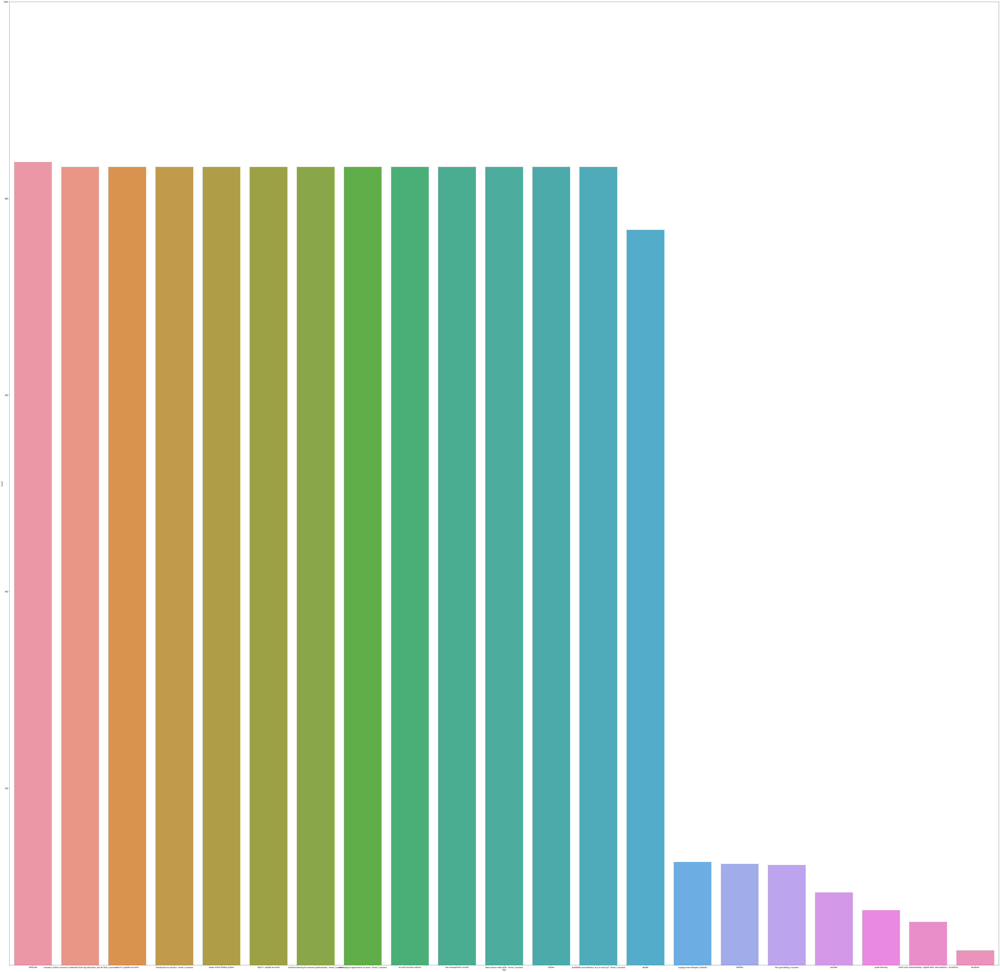

In [75]:
fig= plt.subplots(figsize=(100,100))
sns.barplot(data=top_data_clean,x='Title',y='Count')
plt.ylim(20, 1000)

In [76]:
fig = plt.figure(figsize =(200,200)) 
plt.pie(top_data_clean['Count'],labels=top_data_clean['Title'],textprops={'fontsize': 200})

([<matplotlib.patches.Wedge at 0x1cfd7680ac8>,
 [Text(1.0746645702317974, 0.2347255024246545, 'skillzcafe'),
  Text(0.8797786720518314, 0.6602950008918107, 'coursera | online courses & credentials from top educators. join for free | coursera'),
  Text(0.5268355992291508, 0.9656315298212159, 'sign in \x96 google accounts'),
  Text(0.07906246314265288, 1.097155014991873, 'introduction to calculus - home | coursera'),
  Text(-0.382941864595626, 1.0311913151011434, 'nepse online trading system'),
  Text(-0.7760169071847971, 0.7796138529832202, 'sign in - google accounts'),
  Text(-1.0294094140649148, 0.38770640726525135, 'machine learning for business professionals - home | coursera'),
  Text(-1.0975088997388385, -0.07398793816592274, 'developing ai applications on azure - home | coursera'),
  Text(-0.9680575013283937, -0.5223645031219359, 'account recovery options'),
  Text(-0.6643563858747102, -0.8767157991889352, 'aws management console'),
  Text(-0.2410715555118588, -1.073258824852185,

In [77]:
import random
explode_list =[]
for x in (top_data_clean['Count']):
    x = random.uniform(0.1,0.9)
    explode_list.append(round(x,1))

In [78]:
explode_list

[0.1,
 0.5,
 0.5,
 0.8,
 0.4,
 0.8,
 0.8,
 0.2,
 0.4,
 0.5,
 0.1,
 0.8,
 0.5,
 0.5,
 0.8,
 0.5,
 0.6,
 0.8,
 0.6,
 0.5,
 0.6]

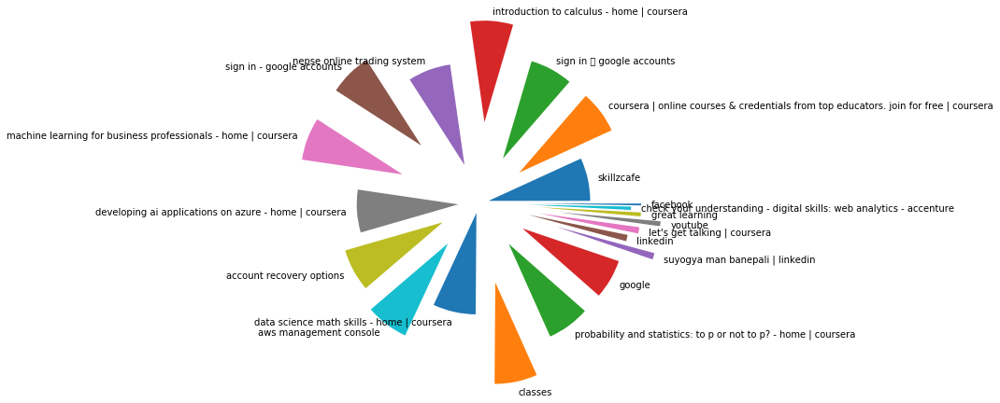

In [97]:
fig, ax = plt.subplots(figsize =(5,5)) 
wedges, texts =plt.pie(top_data_clean['Count'],labels=top_data_clean['Title'],explode=explode_list)
#ax.legend(wedges, top_data_clean['Title'], 
#          title ="Website", 
#          loc ="upper left", 
#          bbox_to_anchor =(2.2, 0, 2, 1))
  
#show plot
plt.savefig('plot_name.png')
plt.show()  